# 🖼️ Photo Vision - Context-Aware Image Editing Image Classifier & Adaptive Enhancer

## 📖 Project Overview  
In this project, I built an AI-powered system that combines **image classification** with **image enhancement techniques** to create an adaptive pipeline.  
The project has two major components:  
1. **Classification**: Identify the type/category of the image.  
2. **Enhancement**: Apply adaptive preprocessing/enhancement methods tailored to the classification results.  

This hybrid approach demonstrates how **deep learning for vision** can be extended beyond recognition to **intelligent adaptive image improvement**.

## 🔹 Workflow Steps 

### ✅ 1. 📂 Importing Libraries & Setup
- Import TensorFlow/Keras, PyTorch (if used), NumPy, Pandas, Matplotlib, Seaborn.
- Set random seed for reproducibility.
- Configure GPU/TPU if available.

In [1]:
#Importing the Libraries
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import os, glob,random
import seaborn as sns
from PIL import Image, ImageEnhance, ImageOps, ImageFilter
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow import keras
from tensorflow.keras.applications import EfficientNetB3, ResNet50
from sklearn.utils.class_weight import compute_class_weight
import math
import cv2

### ✅ 2. Data Loading & Exploration  
- Loaded dataset of categorized images.  
- Performed initial inspection and visualization of sample images.

In [2]:
#Setting Constants & Paths
train_dir = "./training"
val_dir   = "./validation"
test_dir  = "./test"

IMG_SIZE = 224
BATCH_SIZE = 32
SEED = 42

AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
'''
# Directories
dirs = ["./training", "./validation", "./test"]

for root_dir in dirs:
    for folder in os.listdir(root_dir):
        old_path = os.path.join(root_dir, folder)
        if os.path.isdir(old_path):
            # Remove prefix "number_" if present
            if "_" in folder:
                new_name = folder.split("_", 1)[1]  # keep only after first "_"
                new_path = os.path.join(root_dir, new_name)
                
                # Rename only if the new path doesn't already exist
                if not os.path.exists(new_path):
                    os.rename(old_path, new_path)
                    print(f"Renamed: {old_path} --> {new_path}")
                else:
                    print(f"⚠️ Skipped (already exists): {new_path}")
'''

In [3]:
# Regenerate class names after renaming
CLASSES = sorted(next(os.walk(train_dir))[1])
NUM_CLASSES = len(CLASSES)

print("🔎 Classes after renaming:\n")
for idx, c in enumerate(CLASSES, start=1):
    print(f"{idx}. {c}")
print(f"\nTotal number of classes: {NUM_CLASSES}")

🔎 Classes after renaming:

1. Architecture
2. Backlight
3. Beach
4. Blue_Sky
5. Cat
6. Documents
7. Dog
8. Fireworks
9. Flower
10. Food
11. Greenery
12. Group_portrait
13. Indoor
14. Kids
15. Landscape
16. Macro
17. Mountain
18. Portrait
19. Screens
20. Sky
21. Snow
22. Sunrise
23. Underwater
24. Waterfall
25. concert
26. images
27. leaves
28. light
29. lights
30. shot

Total number of classes: 30


### ✅ 3. Preprocessing & Augmentation  
- Resized and normalized images.  
- Applied data augmentation (rotation, flipping, brightness, etc.) to increase robustness.

In [4]:
# Get the first class folder
first_class_folder = os.path.join(train_dir, os.listdir(train_dir)[0])

# Get the first image inside that class folder
image_files = [f for f in os.listdir(first_class_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]
image_path = os.path.join(first_class_folder, image_files[0])

# Open the image using PIL
img = Image.open(image_path)

# Get the size of the image (width, height)
print(f"Original image size: {img.size}")

Original image size: (224, 224)


In [ ]:
'''
def resize_images_in_dir(root_dir, img_size=224):
    for class_name in os.listdir(root_dir):
        class_folder = os.path.join(root_dir, class_name)
        if not os.path.isdir(class_folder):
            continue
        
        for img_file in os.listdir(class_folder):
            if img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_folder, img_file)
                try:
                    img = Image.open(img_path).convert("RGB")
                    # ✅ Use LANCZOS instead of ANTIALIAS
                    img = img.resize((img_size, img_size), Image.Resampling.LANCZOS)  
                    
                    # overwrite the same image
                    img.save(img_path)
                except Exception as e:
                    print(f"⚠️ Error resizing {img_path}: {e}")

# ✅ Apply resizing for all splits
resize_images_in_dir(train_dir, IMG_SIZE)
resize_images_in_dir(val_dir, IMG_SIZE)
resize_images_in_dir(test_dir, IMG_SIZE)

print(f"All images resized to {IMG_SIZE}x{IMG_SIZE}")
'''

In [ ]:
def show_sample_images_per_class(root_dir, classes, samples_per_class=3):
    for class_name in classes:
        class_folder = os.path.join(root_dir, class_name)
        image_files = random.sample(
            [f for f in os.listdir(class_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))],
            min(samples_per_class, len(os.listdir(class_folder)))
        )
        
        plt.figure(figsize=(samples_per_class * 4, 4))
        for i, img_file in enumerate(image_files, start=1):
            img_path = os.path.join(class_folder, img_file)
            img = Image.open(img_path)
            w, h = img.size

            ax = plt.subplot(1, samples_per_class, i)
            plt.imshow(img)
            plt.title(f"{class_name}\n{w}x{h}px")
            plt.axis("off")

        plt.tight_layout()
        plt.show()


# ✅ Call function (using CLEAN_CLASSES instead of prefixed names)
show_sample_images_per_class(train_dir, CLASSES, samples_per_class=3)

In [4]:
def get_image_counts_table(root_dir):
    counts = {}
    total_images = 0
    
    for class_name in sorted(os.listdir(root_dir)):
        class_folder = os.path.join(root_dir, class_name)
        if os.path.isdir(class_folder):
            num_images = len([
                f for f in glob.glob(os.path.join(class_folder, "*")) 
                if f.lower().endswith(('.png', '.jpg', '.jpeg'))
            ])
            counts[class_name] = num_images
            total_images += num_images
    
    # Convert to DataFrame
    df = pd.DataFrame(list(counts.items()), columns=["Class", "Image Count"])
    df["Percentage"] = (df["Image Count"] / total_images * 100).round(2).astype(str) + " %"
    df = df.sort_values(by="Image Count", ascending=False).reset_index(drop=True)
    
    return df, total_images

# 🔎 Example: Training set
train_df, train_total = get_image_counts_table(train_dir)
print(f"Total images in Training Set: {train_total}\n")
display(train_df)

# 🔎 Validation set
val_df, val_total = get_image_counts_table(val_dir)
print(f"Total images in Validation Set: {val_total}\n")
display(val_df)

# 🔎 Test set
test_df, test_total = get_image_counts_table(test_dir)
print(f"Total images in Test Set: {test_total}\n")
display(test_df)

Total images in Training Set: 9898



,Class,Image Count,Percentage
0,Dog,502,5.07 %
1,Architecture,463,4.68 %
2,Sunrise,420,4.24 %
3,Food,400,4.04 %
4,Cat,373,3.77 %
5,Macro,357,3.61 %
6,Mountain,352,3.56 %
7,Snow,344,3.48 %
8,Landscape,335,3.38 %
9,Beach,334,3.37 %


Total images in Validation Set: 600



,Class,Image Count,Percentage
0,Architecture,20,3.33 %
1,Backlight,20,3.33 %
2,lights,20,3.33 %
3,light,20,3.33 %
4,leaves,20,3.33 %
5,images,20,3.33 %
6,concert,20,3.33 %
7,Waterfall,20,3.33 %
8,Underwater,20,3.33 %
9,Sunrise,20,3.33 %


Total images in Test Set: 600



,Class,Image Count,Percentage
0,Architecture,20,3.33 %
1,Backlight,20,3.33 %
2,lights,20,3.33 %
3,light,20,3.33 %
4,leaves,20,3.33 %
5,images,20,3.33 %
6,concert,20,3.33 %
7,Waterfall,20,3.33 %
8,Underwater,20,3.33 %
9,Sunrise,20,3.33 %


In [5]:
# --- Merge into a single summary table ---
summary_df = pd.DataFrame({
    "Class": train_df["Class"],
    "Train Count": train_df["Image Count"],
    "Train %": train_df["Percentage"],
    "Val Count": val_df["Image Count"],
    "Val %": val_df["Percentage"],
    "Test Count": test_df["Image Count"],
    "Test %": test_df["Percentage"],
})

display(summary_df)

,Class,Train Count,Train %,Val Count,Val %,Test Count,Test %
0,Dog,502,5.07 %,20,3.33 %,20,3.33 %
1,Architecture,463,4.68 %,20,3.33 %,20,3.33 %
2,Sunrise,420,4.24 %,20,3.33 %,20,3.33 %
3,Food,400,4.04 %,20,3.33 %,20,3.33 %
4,Cat,373,3.77 %,20,3.33 %,20,3.33 %
5,Macro,357,3.61 %,20,3.33 %,20,3.33 %
6,Mountain,352,3.56 %,20,3.33 %,20,3.33 %
7,Snow,344,3.48 %,20,3.33 %,20,3.33 %
8,Landscape,335,3.38 %,20,3.33 %,20,3.33 %
9,Beach,334,3.37 %,20,3.33 %,20,3.33 %


/var/folders/n3/1j5nrn9930j2yg8rlrdbgt6c0000gn/T/ipykernel_39082/3901602535.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=list(labels), y=list(values), palette="tab20")


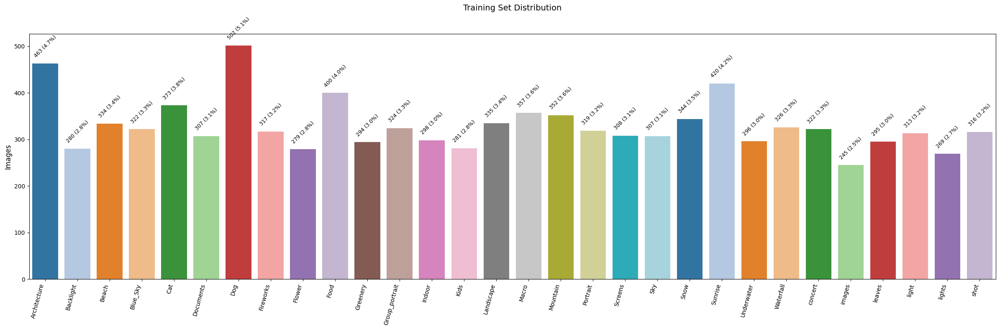

/var/folders/n3/1j5nrn9930j2yg8rlrdbgt6c0000gn/T/ipykernel_39082/3901602535.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=list(labels), y=list(values), palette="tab20")


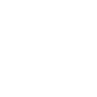

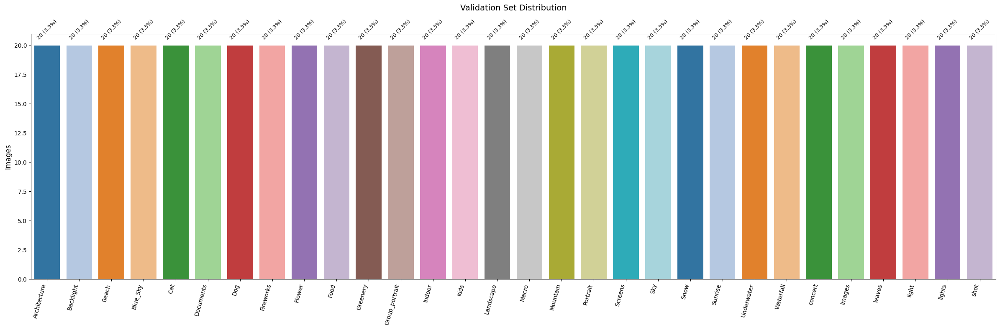

/var/folders/n3/1j5nrn9930j2yg8rlrdbgt6c0000gn/T/ipykernel_39082/3901602535.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=list(labels), y=list(values), palette="tab20")


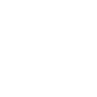

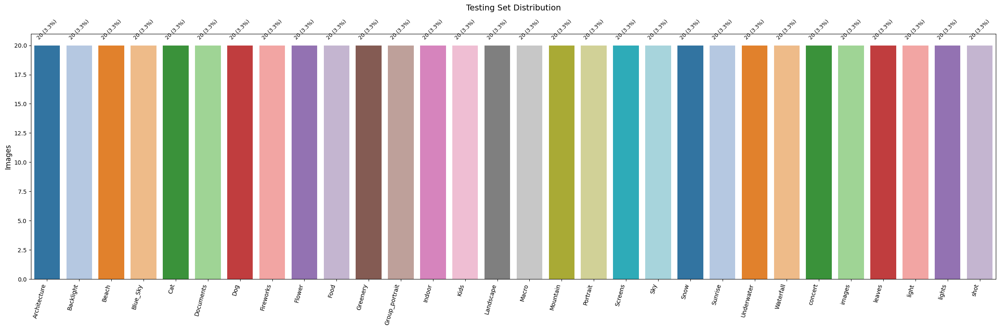

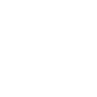

In [6]:
# --- Function to count images in each class folder ---
def count_images_in_folder(root_dir):
    counts = {}
    for class_name in sorted(os.listdir(root_dir)):
        class_folder = os.path.join(root_dir, class_name)
        if os.path.isdir(class_folder):
            counts[class_name] = len([
                f for f in glob.glob(os.path.join(class_folder, "*")) 
                if f.lower().endswith(('.png', '.jpg', '.jpeg'))
            ])
    return counts

# ✅ Recompute counts for train, val, test
train_counts = count_images_in_folder(train_dir)
val_counts   = count_images_in_folder(val_dir)
test_counts  = count_images_in_folder(test_dir)


# 📊 Improved Function to plot distributions with safe title spacing
def plot_distribution(counts, title):
    items = sorted(counts.items())
    labels, values = zip(*items)
    total = sum(values)

    # Dynamic figure width based on number of classes
    plt.figure(figsize=(len(labels) * 0.8, 8))  
    
    ax = sns.barplot(x=list(labels), y=list(values), palette="tab20")
    
    # Annotate each bar with count + percentage (slightly lower than before)
    for i, v in enumerate(values):
        ax.text(
            i, v + (max(values) * 0.02),   # ⬅ lower the text closer to the bar
            f"{v} ({(v/total)*100:.1f}%)",
            ha="center", va="bottom", fontsize=9, rotation=45
        )
    
    # Add extra padding to keep title away from bars
    plt.title(title, fontsize=14, pad=40)   # ⬅ increased pad from 20 → 40
    plt.ylabel("Images", fontsize=12)
    plt.xticks(rotation=75, ha="right")
    plt.tight_layout()
    plt.show()
    
    # 👇 Add spacing after each graph
    plt.figure(figsize=(1,1))
    plt.axis("off")

# Plot distributions with fixes
plot_distribution(train_counts, "Training Set Distribution")
plot_distribution(val_counts, "Validation Set Distribution")
plot_distribution(test_counts, "Testing Set Distribution")

In [ ]:
def evaluate_and_visualize_all(model, test_dir, class_names, img_size=224, batch_size=32, cols=6):
    # 1. Load dataset (all images in test_dir)
    test_ds = tf.keras.utils.image_dataset_from_directory(
        test_dir,
        labels="inferred",
        label_mode="int",
        class_names=class_names,
        image_size=(img_size, img_size),
        batch_size=batch_size,
        shuffle=False
    )

    # 2. Predict on all test images
    preds = model.predict(test_ds, verbose=1)
    pred_labels = np.argmax(preds, axis=1)
    confidences = np.max(preds, axis=1)

    # 3. True labels
    true_labels = np.concatenate([y.numpy() for _, y in test_ds], axis=0)

    # 4. Accuracy
    acc = np.mean(true_labels == pred_labels)
    print(f"✅ Test Accuracy: {acc:.2%}")

    # 5. Display all images in grid (3 per row)
    total_images = len(true_labels)
    rows = int(np.ceil(total_images / cols))

    plt.figure(figsize=(5 * cols, 5 * rows))
    for idx in range(total_images):
        img_path = test_ds.file_paths[idx]
        img = tf.keras.utils.load_img(img_path, target_size=(img_size, img_size))

        plt.subplot(rows, cols, idx + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(
            f"T: {class_names[true_labels[idx]]}\nP: {class_names[pred_labels[idx]]} ({confidences[idx]:.2f})",
            color="green" if true_labels[idx] == pred_labels[idx] else "red",
            fontsize=9
        )

    plt.tight_layout()
    plt.show()

### ✅ 4. Model Building  
- Implemented a **Convolutional Neural Network (CNN)** baseline model.  
- Used **transfer learning** (e.g., ResNet/EfficientNet) for improved performance.  
- Added adaptive layers for enhancement after classification.

In [8]:
def build_EfficientNetB0_transfer_model(train_dir, test_dir):
    AUTOTUNE = tf.data.AUTOTUNE

    # --- Train / Validation split ---
    raw_train_ds = keras.utils.image_dataset_from_directory(
        train_dir,
        labels="inferred",
        label_mode="int",
        class_names=CLASSES,
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        color_mode="rgb",
        validation_split=0.15,
        subset="training",
        seed=SEED,
        shuffle=True
    )

    val_ds = keras.utils.image_dataset_from_directory(
        train_dir,
        labels="inferred",
        label_mode="int",
        class_names=CLASSES,
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        color_mode="rgb",
        validation_split=0.15,
        subset="validation",
        seed=SEED,
        shuffle=True
    )

    test_ds = keras.utils.image_dataset_from_directory(
        test_dir,
        labels="inferred",
        label_mode="int",
        class_names=CLASSES,
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        color_mode="rgb",
        shuffle=False
    )

    # --- Compute class weights ---
    labels_list = [y.numpy().reshape(-1) for _, y in raw_train_ds.unbatch()]
    y_train = np.concatenate(labels_list, axis=0)
    class_weights = compute_class_weight(
        class_weight="balanced",
        classes=np.arange(NUM_CLASSES),
        y=y_train
    )
    class_weights = dict(enumerate(class_weights))

    # Cache + prefetch
    train_ds = raw_train_ds.shuffle(1000).cache().prefetch(AUTOTUNE)
    val_ds   = val_ds.cache().prefetch(AUTOTUNE)
    test_ds  = test_ds.cache().prefetch(AUTOTUNE)

    # --- Base Model ---
    base_model = keras.applications.EfficientNetB0(
        include_top=False,
        weights="imagenet",
        input_shape=(IMG_SIZE, IMG_SIZE, 3)
    )
    base_model.trainable = False   # freeze backbone

    # --- Model ---
    inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = keras.applications.efficientnet.preprocess_input(inputs)
    x = base_model(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

    model = keras.Model(inputs, outputs)

    # Compile
    model.compile(
        optimizer=keras.optimizers.Adam(1e-3),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    # --- Callbacks ---
    callbacks = [
        keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True, monitor="val_accuracy"),
        keras.callbacks.ReduceLROnPlateau(patience=2, factor=0.5, monitor="val_loss")
    ]

    # --- Training ---
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=10,
        class_weight=class_weights,
        callbacks=callbacks,
        verbose=1
    )

    return model, history, test_ds

In [9]:
EfficientNetB0_transfer_model, EfficientNetB0_transfer_model_history, EfficientNetB0_transfer_model_test_ds = build_EfficientNetB0_transfer_model(train_dir, test_dir)

Found 9898 files belonging to 30 classes.
Using 8414 files for training.
Metal device set to: Apple M2
Found 9898 files belonging to 30 classes.
Using 1484 files for validation.
Found 600 files belonging to 30 classes.


2025-09-30 22:58:51.371926: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


Epoch 1/10
263/263 [==============================] - 50s 170ms/step - loss: 0.9559 - accuracy: 0.7938 - val_loss: 0.3579 - val_accuracy: 0.9151 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 41s 157ms/step - loss: 0.2788 - accuracy: 0.9386 - val_loss: 0.2576 - val_accuracy: 0.9306 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 41s 155ms/step - loss: 0.1783 - accuracy: 0.9624 - val_loss: 0.2201 - val_accuracy: 0.9373 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 845s 3s/step - loss: 0.1273 - accuracy: 0.9756 - val_loss: 0.1996 - val_accuracy: 0.9380 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 41s 155ms/step - loss: 0.0958 - accuracy: 0.9845 - val_loss: 0.1864 - val_accuracy: 0.9434 - lr: 0.0010
Epoch 6/10
263/263 [==============================] - 42s 160ms/step - loss: 0.0747 - accuracy: 0.9892 - val_loss: 0.1774 - val_accuracy: 0.9454 - lr: 0.0010
Epoch 7/10
263/263 [==============================] - 

In [10]:
# 📌 Folder to store all versions
save_dir = "Saved Models/EfficientNetB0"

In [11]:
os.makedirs(save_dir, exist_ok=True)

# Save in new .keras format (recommended going forward)
EfficientNetB0_transfer_model.save(os.path.join(save_dir, "EfficientNetB0_transfer_model.keras"))

'''
# Save in legacy HDF5 format
EfficientNetB0_transfer_model.save(os.path.join(save_dir, "EfficientNetB0_transfer_model.h5"))

# Save as TensorFlow SavedModel (for deployment / TF Serving / TFLite)
EfficientNetB0_transfer_model.export(os.path.join(save_dir, "EfficientNetB0_SavedModel"))
'''
print(f"✅ Model saved in all formats under: {save_dir}")


✅ Model saved in all formats under: Saved Models/EfficientNetB0


In [12]:
# --- Load from .keras format ---
EfficientNetB0_transfer_model = tf.keras.models.load_model(os.path.join(save_dir, "EfficientNetB0_transfer_model.keras"))
print("✅ Loaded from .keras format")
EfficientNetB0_transfer_model.summary()
'''
# --- Load from .h5 format ---
EfficientNetB0_transfer_model_h5_model = tf.keras.models.load_model(os.path.join(save_dir, "EfficientNetB0_transfer_model.h5"))
print("✅ Loaded from .h5 format")
h5_model.summary()

# --- Load from SavedModel format ---
EfficientNetB0_transfer_model_saved_model = tf.keras.models.load_model(os.path.join(save_dir, "EfficientNetB0_SavedModel"))
print("✅ Loaded from SavedModel format")
saved_model.summary()
'''

✅ Loaded from .keras format
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetb0 (Functional)  (None, 7, 7, 1280)       4049571   
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 30)                38430     
                                                                 
Total params: 4,088,001
Trainable params: 38,430
Non-trainable params: 4,049,571
__________________

'\n# --- Load from .h5 format ---\nEfficientNetB0_transfer_model_h5_model = tf.keras.models.load_model(os.path.join(save_dir, "EfficientNetB0_transfer_model.h5"))\nprint("✅ Loaded from .h5 format")\nh5_model.summary()\n\n# --- Load from SavedModel format ---\nEfficientNetB0_transfer_model_saved_model = tf.keras.models.load_model(os.path.join(save_dir, "EfficientNetB0_SavedModel"))\nprint("✅ Loaded from SavedModel format")\nsaved_model.summary()\n'

In [ ]:
evaluate_and_visualize_all(EfficientNetB0_transfer_model, test_dir, class_names = CLASSES, img_size=224, batch_size=32, cols=6)

### ✅ 5. Training & Evaluation  
- Trained with **categorical cross-entropy loss**.  
- Compared baseline CNN vs transfer learning results.

In [13]:
def build_and_finetune_EfficientNetB0_model(train_dir, test_dir, unfreeze_layers=60):
    AUTOTUNE = tf.data.AUTOTUNE

    # --- Train / Validation split ---
    raw_train_ds = keras.utils.image_dataset_from_directory(
        train_dir,
        labels="inferred",
        label_mode="int",
        class_names=CLASSES,
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        color_mode="rgb",
        validation_split=0.15,
        subset="training",
        seed=SEED,
        shuffle=True
    )

    val_ds = keras.utils.image_dataset_from_directory(
        train_dir,
        labels="inferred",
        label_mode="int",
        class_names=CLASSES,
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        color_mode="rgb",
        validation_split=0.15,
        subset="validation",
        seed=SEED,
        shuffle=True
    )

    test_ds = keras.utils.image_dataset_from_directory(
        test_dir,
        labels="inferred",
        label_mode="int",
        class_names=CLASSES,
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        color_mode="rgb",
        shuffle=False
    )

    # --- Compute class weights ---
    labels_list = [y.numpy().reshape(-1) for _, y in raw_train_ds.unbatch()]
    y_train = np.concatenate(labels_list, axis=0)
    class_weights = compute_class_weight(
        class_weight="balanced",
        classes=np.arange(NUM_CLASSES),
        y=y_train
    )
    class_weights = dict(enumerate(class_weights))

    # Cache + prefetch
    train_ds = raw_train_ds.shuffle(1000).cache().prefetch(AUTOTUNE)
    val_ds   = val_ds.cache().prefetch(AUTOTUNE)
    test_ds  = test_ds.cache().prefetch(AUTOTUNE)

    # --- Base Model ---
    base_model = keras.applications.EfficientNetB0(
        include_top=False,
        weights="imagenet",
        input_shape=(IMG_SIZE, IMG_SIZE, 3)
    )
    base_model.trainable = False   # freeze backbone

    # --- Model ---
    inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = keras.applications.efficientnet.preprocess_input(inputs)
    x = base_model(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

    model = keras.Model(inputs, outputs)

    # Compile for transfer learning
    model.compile(
        optimizer=keras.optimizers.Adam(1e-3),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    # --- Callbacks ---
    callbacks = [
        keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True, monitor="val_accuracy"),
        keras.callbacks.ReduceLROnPlateau(patience=2, factor=0.5, monitor="val_loss")
    ]

    # --- Phase 1: Transfer Learning ---
    print("🔹 Starting transfer learning...")
    history_transfer = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=10,
        class_weight=class_weights,
        callbacks=callbacks,
        verbose=1
    )

    # --- Phase 2: Fine-Tuning ---
    print(f"\n🔹 Fine-tuning last {unfreeze_layers} layers...")
    for layer in base_model.layers[:-unfreeze_layers]:
        layer.trainable = False
    for layer in base_model.layers[-unfreeze_layers:]:
        layer.trainable = True

    model.compile(
        optimizer=keras.optimizers.Adam(1e-5),  # 👈 lower LR
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    history_finetune = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=10,
        class_weight=class_weights,
        callbacks=callbacks,
        verbose=1
    )

    return model, history_transfer, history_finetune, test_ds

In [14]:
finetuned_EfficientNetB0_model, finetuned_EfficientNetB0_model_transfer_hist, finetuned_EfficientNetB0_model_finetune_hist, finetuned_EfficientNetB0_model_test_ds = build_and_finetune_EfficientNetB0_model(
    train_dir, test_dir, unfreeze_layers=60
)

Found 9898 files belonging to 30 classes.
Using 8414 files for training.
Found 9898 files belonging to 30 classes.
Using 1484 files for validation.
Found 600 files belonging to 30 classes.
🔹 Starting transfer learning...
Epoch 1/10
263/263 [==============================] - 48s 167ms/step - loss: 0.9576 - accuracy: 0.7968 - val_loss: 0.3485 - val_accuracy: 0.9164 - lr: 0.0010
Epoch 2/10
263/263 [==============================] - 42s 161ms/step - loss: 0.2786 - accuracy: 0.9357 - val_loss: 0.2505 - val_accuracy: 0.9353 - lr: 0.0010
Epoch 3/10
263/263 [==============================] - 43s 164ms/step - loss: 0.1783 - accuracy: 0.9610 - val_loss: 0.2137 - val_accuracy: 0.9380 - lr: 0.0010
Epoch 4/10
263/263 [==============================] - 41s 157ms/step - loss: 0.1271 - accuracy: 0.9754 - val_loss: 0.1938 - val_accuracy: 0.9420 - lr: 0.0010
Epoch 5/10
263/263 [==============================] - 42s 159ms/step - loss: 0.0956 - accuracy: 0.9824 - val_loss: 0.1815 - val_accuracy: 0.9407 - 

In [6]:
# 📌 Folder to store all versions
save_dir = "Saved Models/EfficientNetB0"

In [15]:
os.makedirs(save_dir, exist_ok=True)

# Save in new .keras format (recommended going forward)
finetuned_EfficientNetB0_model.save(os.path.join(save_dir, "finetuned_EfficientNetB0_model.keras"))

'''
# Save in legacy HDF5 format
finetuned_EfficientNetB0_model.save(os.path.join(save_dir, "finetuned_EfficientNetB0_model.h5"))

# Save as TensorFlow SavedModel (for deployment / TF Serving / TFLite)
finetuned_EfficientNetB0_model.export(os.path.join(save_dir, "finetuned_EfficientNetB0_model"))
'''
print(f"✅ Model saved in all formats under: {save_dir}")


✅ Model saved in all formats under: Saved Models/EfficientNetB0


In [16]:
# --- Load from .keras format ---
finetuned_EfficientNetB0_model = tf.keras.models.load_model(os.path.join(save_dir, "finetuned_EfficientNetB0_model.keras"))
print("✅ Loaded from .keras format")
finetuned_EfficientNetB0_model.summary()
'''
# --- Load from .h5 format ---
finetuned_EfficientNetB0_model_h5_model = tf.keras.models.load_model(os.path.join(save_dir, "finetuned_EfficientNetB0_model.h5"))
print("✅ Loaded from .h5 format")
finetuned_EfficientNetB0_model_h5_model.summary()

# --- Load from SavedModel format ---
finetuned_EfficientNetB0_model_saved_model = tf.keras.models.load_model(os.path.join(save_dir, "finetuned_EfficientNetB0_model"))
print("✅ Loaded from SavedModel format")
finetuned_EfficientNetB0_model_saved_model.summary()
'''

✅ Loaded from .keras format
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetb0 (Functional)  (None, 7, 7, 1280)       4049571   
                                                                 
 global_average_pooling2d_1   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_1 (Dropout)         (None, 1280)              0         
                                                                 
 dense_1 (Dense)             (None, 30)                38430     
                                                                 
Total params: 4,088,001
Trainable params: 2,710,494
Non-trainable params: 1,377,507
_____________

'\n# --- Load from .h5 format ---\nfinetuned_EfficientNetB0_model_h5_model = tf.keras.models.load_model(os.path.join(save_dir, "finetuned_EfficientNetB0_model.h5"))\nprint("✅ Loaded from .h5 format")\nfinetuned_EfficientNetB0_model_h5_model.summary()\n\n# --- Load from SavedModel format ---\nfinetuned_EfficientNetB0_model_saved_model = tf.keras.models.load_model(os.path.join(save_dir, "finetuned_EfficientNetB0_model"))\nprint("✅ Loaded from SavedModel format")\nfinetuned_EfficientNetB0_model_saved_model.summary()\n'

In [ ]:
evaluate_and_visualize_all(finetuned_EfficientNetB0_model, test_dir, class_names = CLASSES, img_size=224, batch_size=32, cols=6)

In [ ]:
def build_and_train_CNN_model(train_dir, test_dir):
    AUTOTUNE = tf.data.AUTOTUNE

    # --- Train / Validation split ---
    raw_train_ds = keras.utils.image_dataset_from_directory(
        train_dir,
        labels="inferred",
        label_mode="int",
        class_names=CLASSES,
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        color_mode="rgb",
        validation_split=0.15,
        subset="training",
        seed=SEED,
        shuffle=True
    )

    val_ds = keras.utils.image_dataset_from_directory(
        train_dir,
        labels="inferred",
        label_mode="int",
        class_names=CLASSES,
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        color_mode="rgb",
        validation_split=0.15,
        subset="validation",
        seed=SEED,
        shuffle=True
    )

    test_ds = keras.utils.image_dataset_from_directory(
        test_dir,
        labels="inferred",
        label_mode="int",
        class_names=CLASSES,
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        color_mode="rgb",
        shuffle=False
    )

    # --- Compute class weights ---
    labels_list = [y.numpy().reshape(-1) for _, y in raw_train_ds.unbatch()]
    y_train = np.concatenate(labels_list, axis=0)
    class_weights = compute_class_weight(
        class_weight="balanced",
        classes=np.arange(NUM_CLASSES),
        y=y_train
    )
    class_weights = dict(enumerate(class_weights))

    # Cache + prefetch
    train_ds = raw_train_ds.shuffle(1000).cache().prefetch(AUTOTUNE)
    val_ds   = val_ds.cache().prefetch(AUTOTUNE)
    test_ds  = test_ds.cache().prefetch(AUTOTUNE)

    # --- Deep CNN Model ---
    model = keras.Sequential([
        layers.Rescaling(1./255, input_shape=(IMG_SIZE, IMG_SIZE, 3)),

        # Block 1
        layers.Conv2D(32, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(),

        # Block 2
        layers.Conv2D(64, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(),

        # Block 3
        layers.Conv2D(128, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(),

        # Block 4
        layers.Conv2D(256, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(),

        # Classifier Head
        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(256, activation="relu"),
        layers.Dropout(0.3),
        layers.Dense(NUM_CLASSES, activation="softmax")
    ])

    # Compile
    model.compile(
        optimizer=keras.optimizers.Adam(1e-3),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    # --- Callbacks ---
    callbacks = [
        keras.callbacks.EarlyStopping(patience=4, restore_best_weights=True, monitor="val_accuracy"),
        keras.callbacks.ReduceLROnPlateau(patience=2, factor=0.5, monitor="val_loss")
    ]

    # --- Training ---
    print("🔹 Training deep CNN model from scratch...")
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=25,   # CNN needs more epochs
        class_weight=class_weights,
        callbacks=callbacks,
        verbose=1
    )

    return model, history, test_ds


In [ ]:
CNN_model, CNN_history, CNN_test_ds = build_and_train_CNN_model(train_dir, test_dir)

In [ ]:
# 📌 Folder to store all versions
save_dir = "Saved Models/Custom CNN Model"

In [ ]:
os.makedirs(save_dir, exist_ok=True)

# Save in new .keras format (recommended going forward)
CNN_model.save(os.path.join(save_dir, "CNN_model.keras"))

'''
# Save in legacy HDF5 format
CNN_model.save(os.path.join(save_dir, "CNN_model.h5"))

# Save as TensorFlow SavedModel (for deployment / TF Serving / TFLite)
CNN_model.export(os.path.join(save_dir, "CNN_model"))
'''
print(f"✅ Model saved in all formats under: {save_dir}")


In [ ]:
# --- Load from .keras format ---
CNN_model = tf.keras.models.load_model(os.path.join(save_dir, "CNN_model.keras"))
print("✅ Loaded from .keras format")
CNN_model.summary()
'''
# --- Load from .h5 format ---
CNN_model = tf.keras.models.load_model(os.path.join(save_dir, "CNN_model.h5"))
print("✅ Loaded from .h5 format")
CNN_model.summary()

# --- Load from SavedModel format ---
CNN_model = tf.keras.models.load_model(os.path.join(save_dir, "CNN_model"))
print("✅ Loaded from SavedModel format")
CNN_model.summary()
'''

In [ ]:
evaluate_and_visualize_all(CNN_model, test_dir, class_names = CLASSES, img_size=224, batch_size=32, cols=6)

### ✅ 6. Adaptive Enhancement  
- Based on predicted image type, applied tailored enhancement (contrast adjustment, sharpening, denoising, etc.).  
- Demonstrated how classification can guide preprocessing dynamically. 

In [17]:
# ===== Enhancement primitives (PIL-only; no extra deps) =====
def enhance_brightness(img, factor=1.15):
    return ImageEnhance.Brightness(img).enhance(factor)

def enhance_contrast(img, factor=1.15):
    return ImageEnhance.Contrast(img).enhance(factor)

def enhance_color(img, factor=1.10):
    return ImageEnhance.Color(img).enhance(factor)

def enhance_sharpness(img, factor=1.3):
    return ImageEnhance.Sharpness(img).enhance(factor)

def increase_clarity(img, radius=2, percent=150, threshold=3):
    # Local contrast via UnsharpMask
    return img.filter(ImageFilter.UnsharpMask(radius=radius, percent=percent, threshold=threshold))

def local_contrast(img, radius=3, percent=80, threshold=3):
    return img.filter(ImageFilter.UnsharpMask(radius=radius, percent=percent, threshold=threshold))

def gamma_correction(img, gamma=0.9):
    # gamma<1 brightens shadows; >1 darkens
    inv = 1.0 / max(gamma, 1e-6)
    lut = [int((i / 255.0) ** inv * 255.0 + 0.5) for i in range(256)]
    return img.point(lut * 3)

def auto_white_balance_grayworld(img):
    # Simple gray-world WB correction
    arr = np.asarray(img).astype(np.float32)
    mean = arr.reshape(-1, 3).mean(axis=0) + 1e-6
    gray = mean.mean()
    scale = gray / mean
    out = np.clip(arr * scale, 0, 255).astype(np.uint8)
    return Image.fromarray(out)

def warm_filter(img, strength=0.08):
    # Add warmth by nudging R↑, B↓ slightly
    arr = np.asarray(img).astype(np.float32)
    arr[..., 0] = np.clip(arr[..., 0] * (1.0 + strength), 0, 255)  # R
    arr[..., 2] = np.clip(arr[..., 2] * (1.0 - strength), 0, 255)  # B
    return Image.fromarray(arr.astype(np.uint8))

def cool_filter(img, strength=0.08):
    arr = np.asarray(img).astype(np.float32)
    arr[..., 2] = np.clip(arr[..., 2] * (1.0 + strength), 0, 255)  # B
    arr[..., 0] = np.clip(arr[..., 0] * (1.0 - strength), 0, 255)  # R
    return Image.fromarray(arr.astype(np.uint8))

def dehaze_simple(img):
    # Not true dehaze; mild WB + local contrast + gentle gamma
    x = auto_white_balance_grayworld(img)
    x = local_contrast(x, radius=2, percent=60, threshold=2)
    x = gamma_correction(x, gamma=0.95)
    return x

def denoise_median(img, size=3):
    return img.filter(ImageFilter.MedianFilter(size=size))

def edge_enhance(img):
    return img.filter(ImageFilter.EDGE_ENHANCE_MORE)

# ================================
# 🔹 Dynamic Enhancement Engine
# ================================
def op_brightness(img, amount=0.2):
    return ImageEnhance.Brightness(img).enhance(1.0 + amount)

def op_contrast(img, amount=0.2):
    return ImageEnhance.Contrast(img).enhance(1.0 + amount)

def op_saturation(img, amount=0.2):
    return ImageEnhance.Color(img).enhance(1.0 + amount)

def op_sharpness(img, amount=0.3):
    return ImageEnhance.Sharpness(img).enhance(1.0 + amount)

def op_gamma(img, gamma=0.9):
    inv = 1.0 / max(gamma, 1e-6)
    lut = [int((i / 255.0) ** inv * 255.0 + 0.5) for i in range(256)]
    return img.point(lut * 3)

def op_wb_grayworld(img, strength=0.8):
    arr = np.asarray(img).astype(np.float32)
    mean = arr.reshape(-1, 3).mean(axis=0) + 1e-6
    gray = mean.mean()
    scale = gray / mean
    out = np.clip(arr * scale, 0, 255).astype(np.uint8)
    return Image.fromarray(out)

def op_clarity(img, radius=2, amount=150, threshold=3):
    return img.filter(ImageFilter.UnsharpMask(radius=radius, percent=amount, threshold=threshold))

def op_warm(img, strength=0.08):
    arr = np.asarray(img).astype(np.float32)
    arr[..., 0] *= (1.0 + strength)  # R
    arr[..., 2] *= (1.0 - strength)  # B
    return Image.fromarray(np.clip(arr, 0, 255).astype(np.uint8))

def op_cool(img, strength=0.08):
    arr = np.asarray(img).astype(np.float32)
    arr[..., 2] *= (1.0 + strength)  # B
    arr[..., 0] *= (1.0 - strength)  # R
    return Image.fromarray(np.clip(arr, 0, 255).astype(np.uint8))

def op_denoise(img, size=3):
    return img.filter(ImageFilter.MedianFilter(size=size))

# Registry
OPS = {
    "brightness": op_brightness,
    "contrast": op_contrast,
    "saturation": op_saturation,
    "sharpness": op_sharpness,
    "gamma": op_gamma,
    "wb_grayworld": op_wb_grayworld,
    "clarity": op_clarity,
    "warm": op_warm,
    "cool": op_cool,
    "denoise": op_denoise,
}

In [18]:
def apply_pipeline(img, steps):
    """steps = [ {op:"contrast", amount:0.2}, ... ]"""
    out = img.copy()
    for step in steps:
        fn = OPS.get(step["op"])
        if fn:
            kwargs = {k: v for k, v in step.items() if k != "op"}
            out = fn(out, **kwargs)
    return out

In [26]:
# ================================
# 🔹 Unified Class → Enhancers Dict
# ================================
CLASS_ENHANCEMENTS = {
    "Architecture": {
        "static": [increase_clarity, enhance_sharpness, enhance_contrast],
        "dynamic": [
            {"op": "clarity", "radius": 2, "amount": 120},
            {"op": "contrast", "amount": 0.15},
            {"op": "sharpness", "amount": 0.2},
        ],
    },
    "Backlight": {
        "static": [gamma_correction, increase_clarity, enhance_color],
        "dynamic": [
            {"op": "wb_grayworld", "strength": 0.9},
            {"op": "gamma", "gamma": 0.8},
            {"op": "contrast", "amount": 0.2},
        ],
    },
    "Beach": {
        "static": [warm_filter, dehaze_simple, enhance_contrast],
        "dynamic": [
            {"op": "wb_grayworld", "strength": 0.8},
            {"op": "saturation", "amount": 0.2},
            {"op": "warm", "strength": 0.1},
        ],
    },
    "Blue_Sky": {
        "static": [dehaze_simple, enhance_color, local_contrast],
        "dynamic": [
            {"op": "contrast", "amount": 0.2},
            {"op": "saturation", "amount": 0.25},
            {"op": "clarity", "radius": 2, "amount": 100},
        ],
    },
    "Cat": {
        "static": [increase_clarity, enhance_sharpness, enhance_color],
        "dynamic": [
            {"op": "sharpness", "amount": 0.3},
            {"op": "contrast", "amount": 0.1},
            {"op": "warm", "strength": 0.08},
        ],
    },
    "Documents": {
        "static": [enhance_contrast, edge_enhance, enhance_sharpness],
        "dynamic": [
            {"op": "contrast", "amount": 0.3},
            {"op": "sharpness", "amount": 0.4},
            {"op": "denoise", "size": 2},
        ],
    },
    "Dog": {
        "static": [increase_clarity, enhance_sharpness, enhance_color],
        "dynamic": [
            {"op": "sharpness", "amount": 0.2},
            {"op": "contrast", "amount": 0.1},
            {"op": "warm", "strength": 0.1},
        ],
    },
    "Fireworks": {
        "static": [enhance_contrast, increase_clarity, denoise_median],
        "dynamic": [
            {"op": "contrast", "amount": 0.25},
            {"op": "saturation", "amount": 0.3},
            {"op": "clarity", "radius": 2, "amount": 130},
        ],
    },
    "Flower": {
        "static": [enhance_color, increase_clarity, enhance_contrast],
        "dynamic": [
            {"op": "saturation", "amount": 0.3},
            {"op": "sharpness", "amount": 0.2},
            {"op": "contrast", "amount": 0.1},
        ],
    },
    "Food": {
        "static": [enhance_color, warm_filter, increase_clarity],
        "dynamic": [
            {"op": "saturation", "amount": 0.25},
            {"op": "contrast", "amount": 0.15},
            {"op": "warm", "strength": 0.1},
        ],
    },
    "Greenery": {
        "static": [enhance_color, local_contrast, enhance_contrast],
        "dynamic": [
            {"op": "saturation", "amount": 0.3},
            {"op": "contrast", "amount": 0.1},
            {"op": "clarity", "radius": 2, "amount": 120},
        ],
    },
    "Group_portrait": {
        "static": [auto_white_balance_grayworld, increase_clarity, enhance_color],
        "dynamic": [
            {"op": "wb_grayworld", "strength": 0.9},
            {"op": "sharpness", "amount": 0.2},
            {"op": "contrast", "amount": 0.15},
        ],
    },
    "Indoor": {
        "static": [auto_white_balance_grayworld, enhance_contrast, denoise_median],
        "dynamic": [
            {"op": "wb_grayworld", "strength": 0.8},
            {"op": "contrast", "amount": 0.15},
            {"op": "denoise", "size": 2},
        ],
    },
    "Kids": {
        "static": [increase_clarity, enhance_color, auto_white_balance_grayworld],
        "dynamic": [
            {"op": "saturation", "amount": 0.25},
            {"op": "brightness", "amount": 0.15},
            {"op": "sharpness", "amount": 0.1},
        ],
    },
    "Landscape": {
        "static": [dehaze_simple, increase_clarity, enhance_color],
        "dynamic": [
            {"op": "wb_grayworld", "strength": 0.9},
            {"op": "contrast", "amount": 0.2},
            {"op": "clarity", "radius": 2, "amount": 120},
        ],
    },
    "Macro": {
        "static": [increase_clarity, enhance_sharpness, enhance_contrast],
        "dynamic": [
            {"op": "sharpness", "amount": 0.5},
            {"op": "contrast", "amount": 0.2},
            {"op": "saturation", "amount": 0.25},
        ],
    },
    "Mountain": {
        "static": [dehaze_simple, increase_clarity, enhance_color],
        "dynamic": [
            {"op": "contrast", "amount": 0.2},
            {"op": "clarity", "radius": 2, "amount": 120},
            {"op": "wb_grayworld", "strength": 0.9},
        ],
    },
    "Portrait": {
        "static": [auto_white_balance_grayworld, enhance_color, increase_clarity],
        "dynamic": [
            {"op": "wb_grayworld", "strength": 0.8},
            {"op": "sharpness", "amount": 0.2},
            {"op": "warm", "strength": 0.1},
        ],
    },
    "Screens": {
        "static": [enhance_contrast, edge_enhance, enhance_sharpness],
        "dynamic": [
            {"op": "contrast", "amount": 0.2},
            {"op": "cool", "strength": 0.1},
            {"op": "sharpness", "amount": 0.15},
        ],
    },
    "Sky": {
        "static": [dehaze_simple, enhance_color, local_contrast],
        "dynamic": [
            {"op": "saturation", "amount": 0.2},
            {"op": "contrast", "amount": 0.2},
            {"op": "clarity", "radius": 2, "amount": 100},
        ],
    },
    "Snow": {
        "static": [cool_filter, increase_clarity, enhance_contrast],
        "dynamic": [
            {"op": "wb_grayworld", "strength": 0.9},
            {"op": "cool", "strength": 0.08},
            {"op": "clarity", "radius": 2, "amount": 120},
        ],
    },
    "Sunrise": {
        "static": [warm_filter, enhance_color, dehaze_simple],
        "dynamic": [
            {"op": "warm", "strength": 0.15},
            {"op": "contrast", "amount": 0.2},
            {"op": "saturation", "amount": 0.2},
        ],
    },
    "Underwater": {
        "static": [auto_white_balance_grayworld, dehaze_simple, enhance_contrast],
        "dynamic": [
            {"op": "cool", "strength": 0.15},
            {"op": "contrast", "amount": 0.2},
            {"op": "clarity", "radius": 2, "amount": 100},
        ],
    },
    "Waterfall": {
        "static": [increase_clarity, dehaze_simple, enhance_contrast],
        "dynamic": [
            {"op": "wb_grayworld", "strength": 0.9},
            {"op": "contrast", "amount": 0.2},
            {"op": "sharpness", "amount": 0.2},
        ],
    },
    "concert": {
        "static": [increase_clarity, enhance_contrast, denoise_median],
        "dynamic": [
            {"op": "contrast", "amount": 0.25},
            {"op": "saturation", "amount": 0.3},
            {"op": "clarity", "radius": 2, "amount": 100},
        ],
    },
    "images": {
        "static": [enhance_contrast, increase_clarity, enhance_color],
        "dynamic": [
            {"op": "contrast", "amount": 0.15},
            {"op": "sharpness", "amount": 0.2},
            {"op": "saturation", "amount": 0.1},
        ],
    },
    "leaves": {
        "static": [enhance_color, increase_clarity, enhance_contrast],
        "dynamic": [
            {"op": "saturation", "amount": 0.3},
            {"op": "contrast", "amount": 0.15},
            {"op": "clarity", "radius": 2, "amount": 100},
        ],
    },
    "light": {
        "static": [gamma_correction, denoise_median, increase_clarity],
        "dynamic": [
            {"op": "wb_grayworld", "strength": 0.9},
            {"op": "contrast", "amount": 0.2},
            {"op": "gamma", "gamma": 0.95},
        ],
    },
    "lights": {
        "static": [enhance_contrast, increase_clarity, enhance_color],
        "dynamic": [
            {"op": "contrast", "amount": 0.25},
            {"op": "saturation", "amount": 0.2},
            {"op": "clarity", "radius": 2, "amount": 120},
        ],
    },
    "shot": {
        "static": [increase_clarity, enhance_contrast, denoise_median],
        "dynamic": [
            {"op": "contrast", "amount": 0.2},
            {"op": "clarity", "radius": 2, "amount": 120},
            {"op": "denoise", "size": 2},
        ],
    },
}


In [20]:
# ===== Loader that matches model's expected preprocessing =====
def load_and_prepare_image(img_path, img_size=224, input_mode="efficientnet"):
    """
    Returns:
      pil_img_fullres (PIL.Image)
      x (1, H, W, 3) float32 — preprocessed for the specified backbone.
    """
    pil_img_full = Image.open(img_path).convert("RGB")
    pil_resized = pil_img_full.resize((img_size, img_size), Image.Resampling.LANCZOS)
    x = np.asarray(pil_resized, dtype=np.float32)
    # Keep as 0..255 for Keras preprocessors; scale to 0..1 otherwise.
    if input_mode == "efficientnet":
        x = keras.applications.efficientnet.preprocess_input(x)
    elif input_mode == "resnet":
        x = keras.applications.resnet.preprocess_input(x)
    elif input_mode == "mobilenet":
        x = keras.applications.mobilenet_v2.preprocess_input(x)
    elif input_mode == "vgg":
        x = keras.applications.vgg16.preprocess_input(x)
    else:
        x = x / 255.0
    x = np.expand_dims(x.astype(np.float32), axis=0)
    return pil_img_full, x

In [27]:
# ===== Visual 1: Original on row 1 (center), 3 enhanced on row 2 =====
def predict_and_enhance(
    model,
    img_path,
    class_names,
    img_size=224,
    input_mode="efficientnet",
    show=True
):
    # 1) Load & prepare input according to model expectation
    pil_img, x = load_and_prepare_image(img_path, img_size=img_size, input_mode=input_mode)

    # 2) Predict
    preds = model.predict(x, verbose=0)
    pred_index = int(np.argmax(preds[0]))
    pred_conf  = float(np.max(preds[0]))
    pred_class = class_names[pred_index]
    print(f"Predicted Class: {pred_class} (conf {pred_conf:.3f})")

    # 3) Pick correct enhancers
    enh_cfg = CLASS_ENHANCEMENTS.get(
        pred_class,
        {"static": [enhance_brightness, enhance_contrast, enhance_color]}
    )

    # --- Apply static ones ---
    static_fns = enh_cfg["static"]
    static_imgs = [fn(pil_img.copy()) for fn in static_fns[:3]]

    # --- Apply dynamic ones ---
    dynamic_cfgs = enh_cfg.get("dynamic", [])
    dynamic_imgs = []
    for cfg in dynamic_cfgs[:3]:
        op = cfg["op"]
        if op == "contrast":
            dynamic_imgs.append(enhance_contrast(pil_img.copy(), factor=1.0 + cfg["amount"]))
        elif op == "sharpness":
            dynamic_imgs.append(enhance_sharpness(pil_img.copy(), factor=1.0 + cfg["amount"]))
        elif op == "clarity":
            dynamic_imgs.append(increase_clarity(pil_img.copy(), radius=cfg.get("radius", 2), percent=cfg.get("amount", 120)))
        elif op == "gamma":
            dynamic_imgs.append(gamma_correction(pil_img.copy(), gamma=cfg["gamma"]))
        elif op == "wb_grayworld":
            dynamic_imgs.append(auto_white_balance_grayworld(pil_img.copy()))
        elif op == "warm":
            dynamic_imgs.append(warm_filter(pil_img.copy(), strength=cfg["strength"]))
        elif op == "cool":
            dynamic_imgs.append(cool_filter(pil_img.copy(), strength=cfg["strength"]))
        elif op == "saturation":
            dynamic_imgs.append(enhance_color(pil_img.copy(), factor=1.0 + cfg["amount"]))
        elif op == "brightness":
            dynamic_imgs.append(enhance_brightness(pil_img.copy(), factor=1.0 + cfg["amount"]))
        elif op == "denoise":
            dynamic_imgs.append(denoise_median(pil_img.copy(), size=cfg.get("size", 3)))
        else:
            print(f"[WARN] Unknown op {op}, skipping")

    # Combine
    enhanced_imgs = static_imgs + dynamic_imgs

    # 4) Visualization
    if show:
        ncols = 3
        nrows = 1 + int(np.ceil(len(enhanced_imgs) / ncols))
        plt.figure(figsize=(18, 6 * nrows))

        # Row 1: Original in center
        plt.subplot(nrows, ncols, 2)
        plt.imshow(pil_img)
        plt.axis("off")
        img_name = os.path.basename(img_path)
        plt.title(f"{img_name}\nPred: {pred_class} ({pred_conf:.2f})")

        # Row 2+: enhanced images
        for i, eimg in enumerate(enhanced_imgs, 1):
            plt.subplot(nrows, ncols, i + ncols)
            plt.imshow(eimg)
            plt.axis("off")
            plt.title(f"Enh {i}")

        plt.tight_layout()
        plt.show()

    return pred_class, pred_conf, enhanced_imgs


In [28]:
image_path_one = 'test_adaptive_enhancer/test_architecture_1.jpg'

In [ ]:
pred_cls, conf, outs = predict_and_enhance(finetuned_EfficientNetB0_model,image_path, CLASSES, img_size=IMG_SIZE)

In [22]:
# ===== Batch helper (optional): run on a directory of images =====
def predict_and_enhance_dir(
    model, in_dir, class_names, img_size=224, input_mode="efficientnet",
    save_dir=None
):
    exts = {".jpg", ".jpeg", ".png", ".bmp", ".tiff", ".webp"}
    paths = [p for p in glob.glob(os.path.join(in_dir, "**", "*"), recursive=True)
             if os.path.splitext(p)[1].lower() in exts]

    if not paths:
        print("No images found.")
        return

    for p in paths:
        try:
            predict_and_enhance(model, p, class_names, img_size, input_mode, show=True)
        except Exception as e:
            print(f"⚠️ Skipped {p}: {e}")

Predicted Class: Dog (conf 0.998)


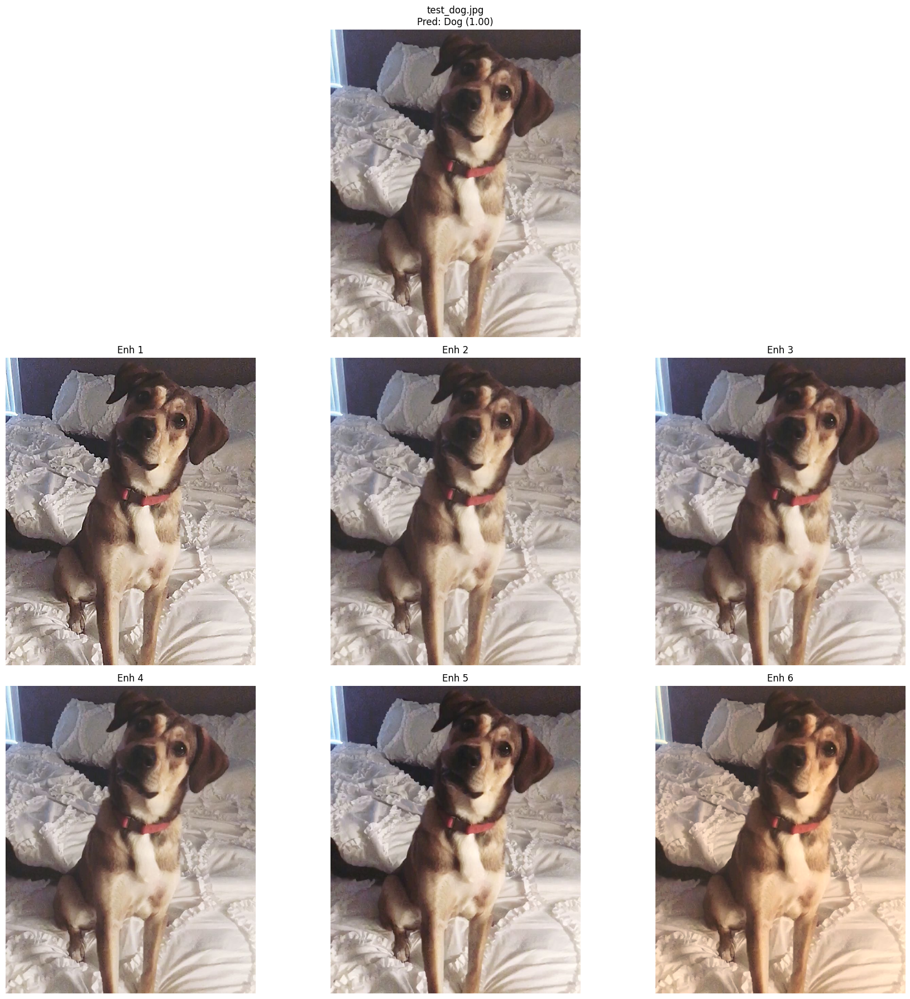

Predicted Class: concert (conf 0.992)


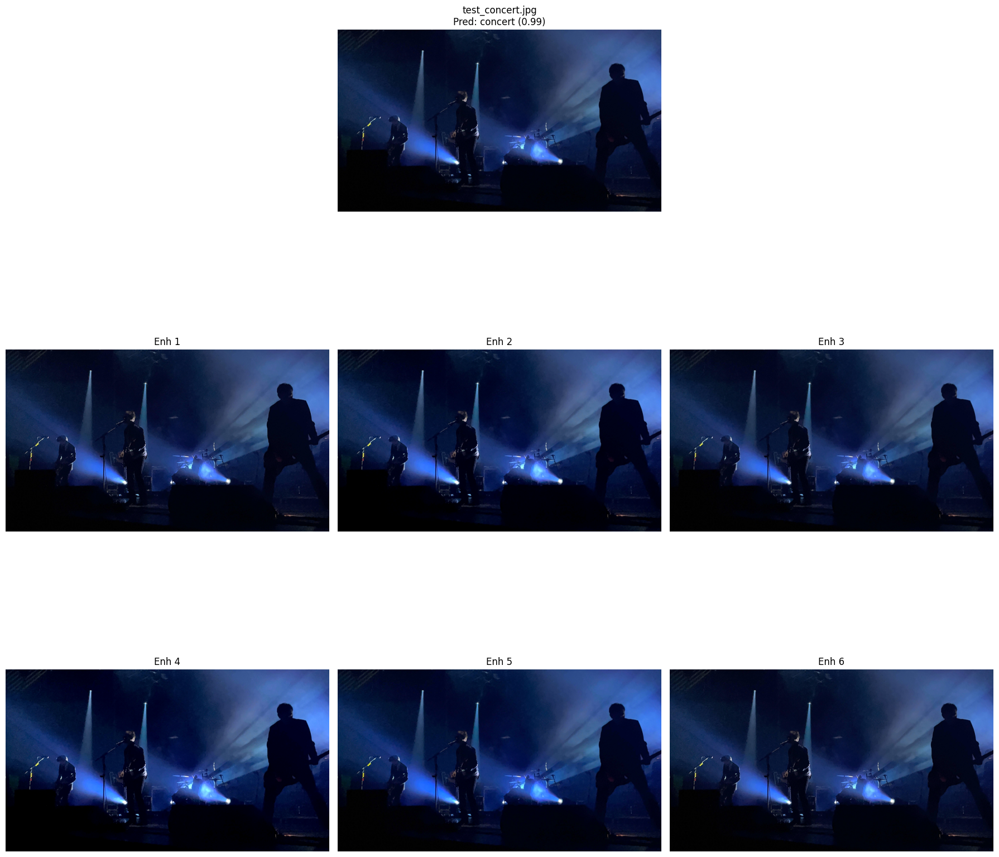

Predicted Class: Cat (conf 0.999)


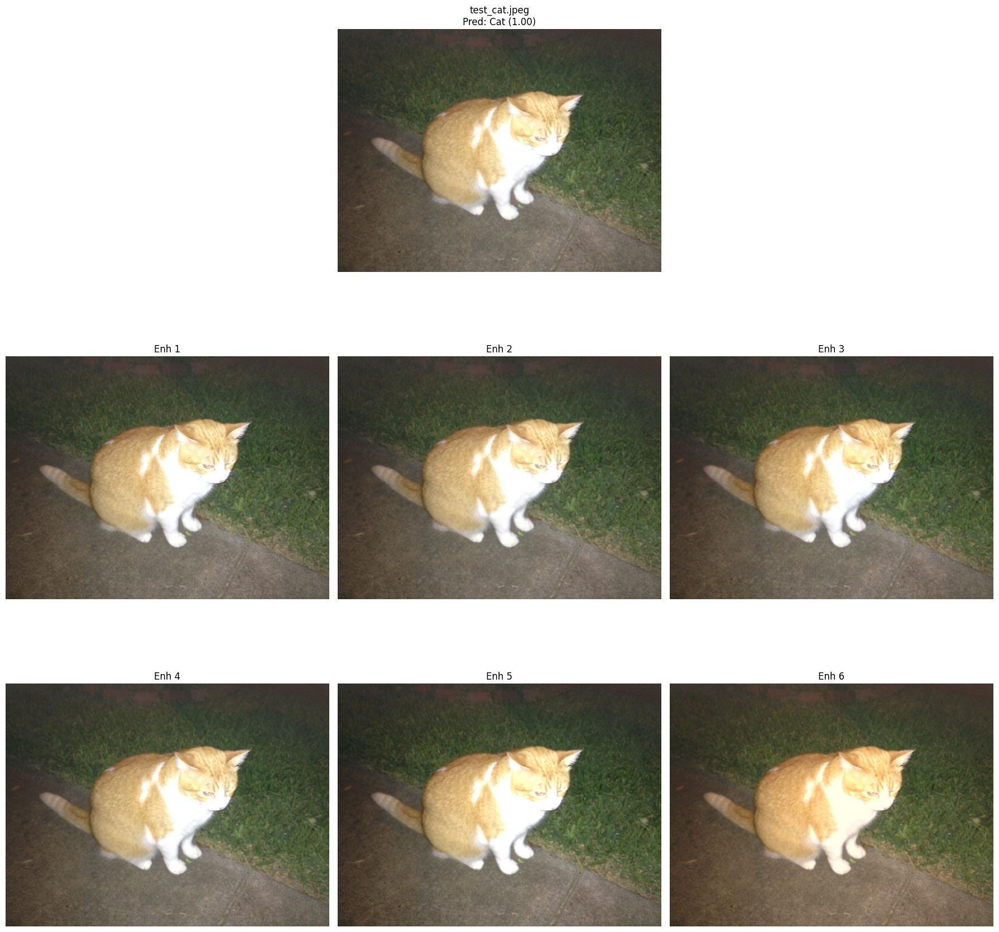

Predicted Class: Backlight (conf 0.531)


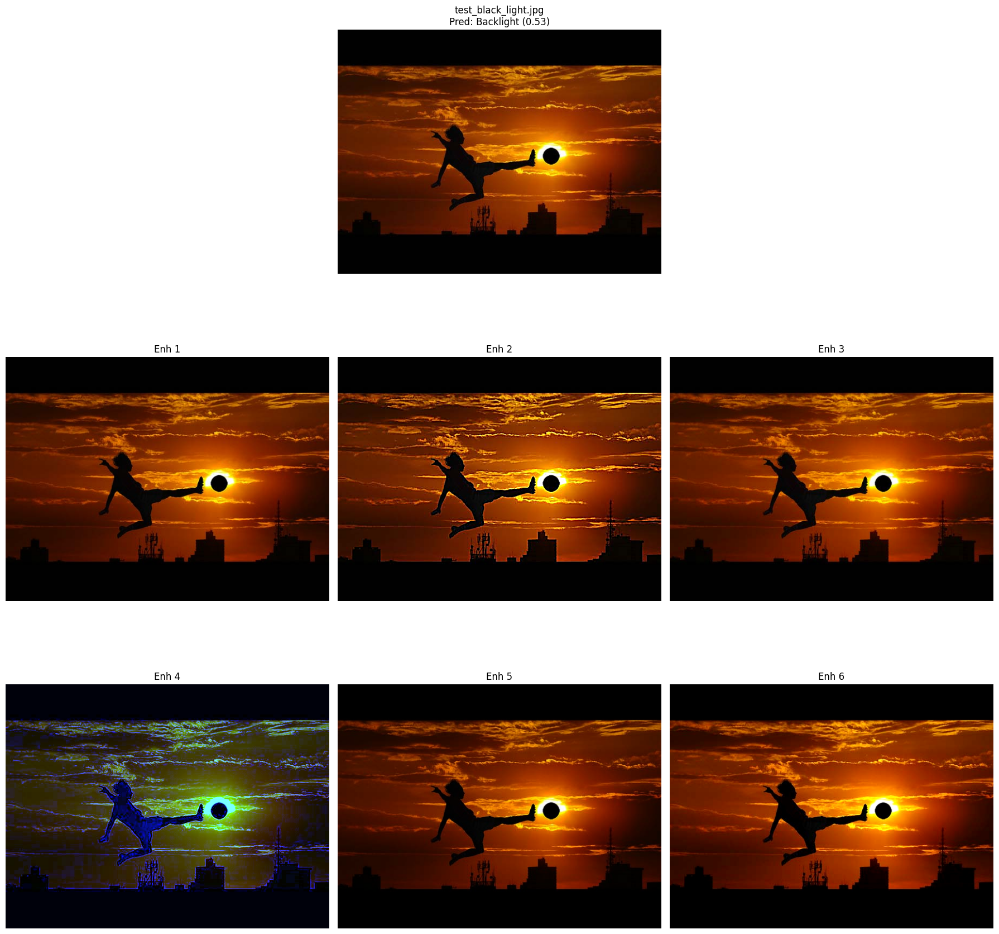

Predicted Class: Architecture (conf 0.592)


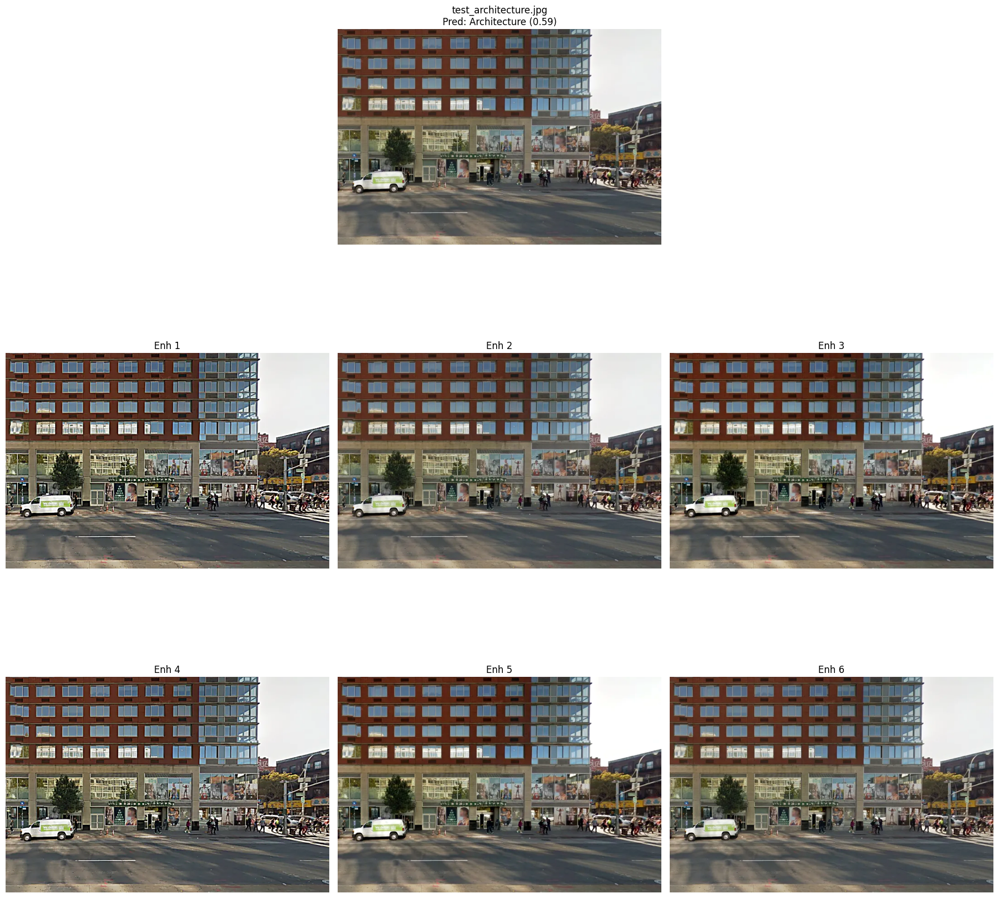

In [30]:
predict_and_enhance_dir(
    finetuned_EfficientNetB0_model, 'test_adaptive_enhancer', class_names = CLASSES, img_size=224, input_mode="efficientnet",
    save_dir=None
)

## ✅ 📊 Results & Insights  
- CNN baseline provided moderate accuracy.  
- Transfer learning models (ResNet/EfficientNet) achieved significantly higher accuracy.  
- Adaptive enhancement improved image clarity and highlighted how **vision AI can serve real-world applications** (e.g., medical imaging, photography tools).

## ✅ Conclusion  
This project showcases how image classification can go beyond recognition and act as a **decision trigger** for adaptive enhancement.  
It demonstrates the potential for **smart imaging pipelines** where AI not only classifies but also **optimizes images dynamically** for downstream use cases.  

Next steps:  
- Extend enhancement pipeline with **GAN-based super-resolution**.  
- Deploy the classifier + enhancer as a **web app** for real-time use.